In [1]:
!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()

YOLOv5 🚀 v7.0-280-g4878541d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.4/78.2 GB disk)


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="k5LvHek09pAXOx7Dn5d3")
project = rf.workspace("akash-k-p-gs9iu").project("aadhaar-card-details-extraction")
dataset = project.version(4).download("yolov5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.0/70.0 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 18.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 8.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aadhaar-card--details-extraction-4 in yolov5pytorch:: 100%|██████████| 5304/5304 [00:00<00:00, 6358.08it/s]


In [3]:
!mv /content/yolov5/Aadhaar-card--details-extraction-4 /content/

In [4]:
!mv /content/Aadhaar-card--details-extraction-4/data.yaml /content/

In [6]:
!python train.py --img 640 --batch 32 --epochs 75 --data /content/data.yaml --weights yolov5s.pt

2024-01-29 04:37:01.912565: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-29 04:37:01.912619: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-29 04:37:01.913921: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=75, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=Fal

In [10]:
%cd ..

/content


In [17]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'custom', path = '/content/yolov5/runs/train/exp2/weights/best.pt', force_reload = True)


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 v7.0-280-g4878541d Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7023610 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


In [23]:
from PIL import Image

im = Image.open('/content/image_testing.jpg')
results = model(im)  # inference

results.show()

UnidentifiedImageError: cannot identify image file '/content/image_testing.jpg'

In [24]:
!ls

dataset  data.yaml  image_testing.jpg  yolov5


In [31]:
import cv2

img = cv2.imread("nakli.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)


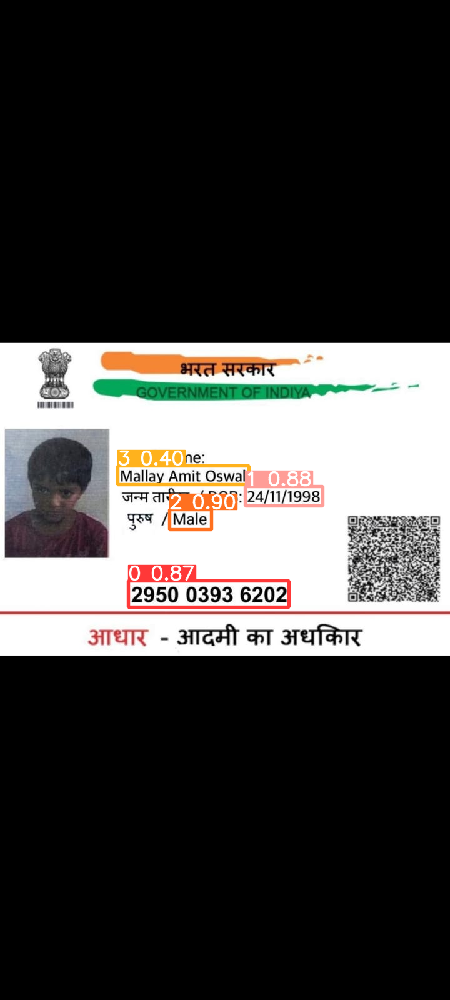

In [32]:
results = model(img)  # inference

results.show()

In [137]:
import cv2

img = cv2.imread("/content/aadhar_testing.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

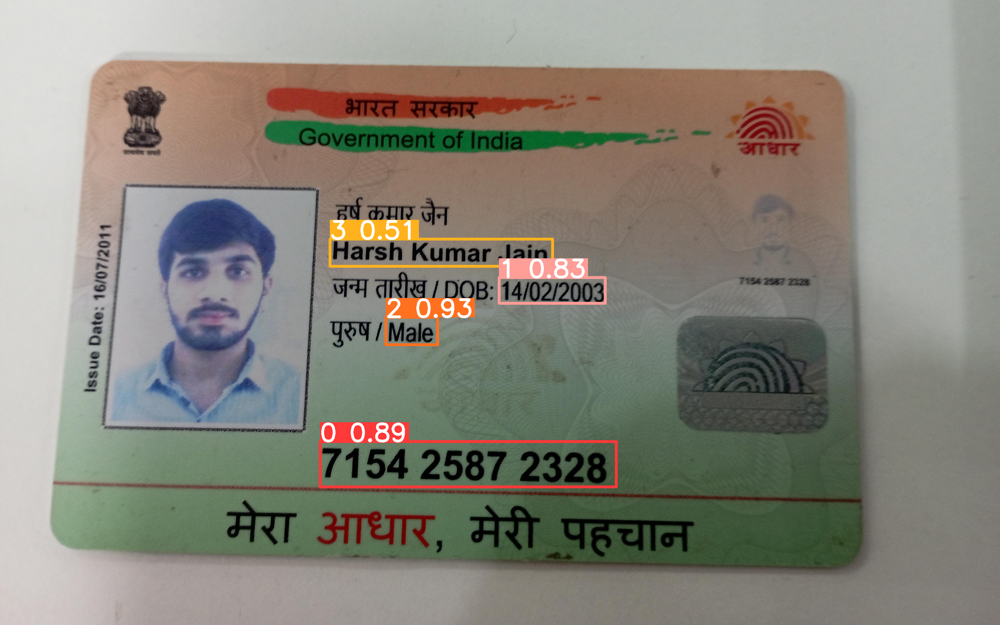

In [138]:
results = model(img)  # inference
# results.crop(save=True)
results.show()

In [160]:
import cv2

img = cv2.imread("/content/5418a2dd-eac7-40dd-b8bd-1f372494f5aa.jpeg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

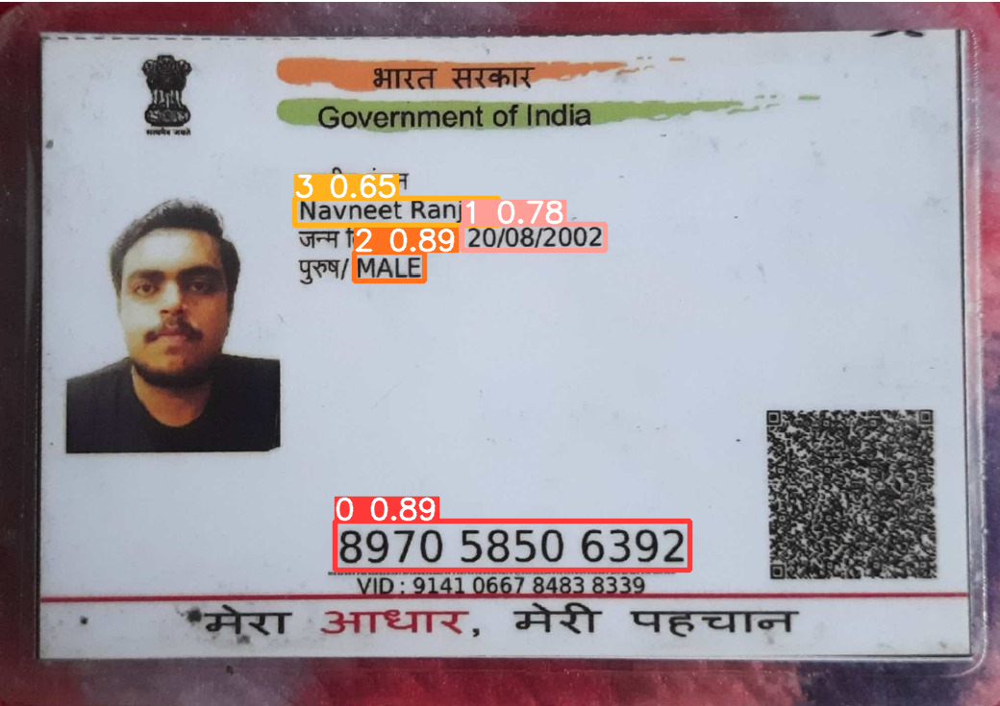

In [161]:
results = model(img)  # inference

results.show()

In [162]:
pandas_res = results.xyxy[0]

In [163]:
pandas_res = pandas_res.cpu()

pandas_res

tensor([[3.68247e+02, 2.62930e+02, 4.41472e+02, 2.92262e+02, 8.94599e-01, 2.00000e+00],
        [3.48377e+02, 5.42804e+02, 7.17394e+02, 5.93375e+02, 8.85900e-01, 0.00000e+00],
        [4.80867e+02, 2.33563e+02, 6.29452e+02, 2.60629e+02, 7.81322e-01, 1.00000e+00],
        [3.06767e+02, 2.06364e+02, 5.18217e+02, 2.34310e+02, 6.46093e-01, 3.00000e+00]])

In [ ]:
!pip install paddlepaddle-gpu
!pip install paddleocr

In [72]:
from paddleocr import PaddleOCR

ocr = PaddleOCR(use_angle_cls=True, lang='en')


[2024/01/29 08:15:10] ppocr DEBUG: Namespace(help='==SUPPRESS==', use_gpu=True, use_xpu=False, use_npu=False, ir_optim=True, use_tensorrt=False, min_subgraph_size=15, precision='fp32', gpu_mem=500, gpu_id=0, image_dir=None, page_num=0, det_algorithm='DB', det_model_dir='/root/.paddleocr/whl/det/en/en_PP-OCRv3_det_infer', det_limit_side_len=960, det_limit_type='max', det_box_type='quad', det_db_thresh=0.3, det_db_box_thresh=0.6, det_db_unclip_ratio=1.5, max_batch_size=10, use_dilation=False, det_db_score_mode='fast', det_east_score_thresh=0.8, det_east_cover_thresh=0.1, det_east_nms_thresh=0.2, det_sast_score_thresh=0.5, det_sast_nms_thresh=0.2, det_pse_thresh=0, det_pse_box_thresh=0.85, det_pse_min_area=16, det_pse_scale=1, scales=[8, 16, 32], alpha=1.0, beta=1.0, fourier_degree=5, rec_algorithm='SVTR_LCNet', rec_model_dir='/root/.paddleocr/whl/rec/en/en_PP-OCRv4_rec_infer', rec_image_inverse=True, rec_image_shape='3, 48, 320', rec_batch_num=6, max_text_length=25, rec_char_dict_path='/

In [97]:
import numpy as np

def get_cropped_image(image, bounding_box):
    """
        fetches the cropped part of image where a particular
        document is predicted to be according to the bounding
        box coordinates
    """

    bounding_box = bounding_box


    x1 = np.int32(bounding_box[0])
    y1 = np.int32(bounding_box[1])
    x2 = np.int32(bounding_box[2])
    y2 = np.int32(bounding_box[3])

    cropped_image = image[y1:y2, x1:x2]
    cropped_image = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

    if isinstance(cropped_image, torch.Tensor) and cropped_image.is_cuda:
        cropped_image = cropped_image.cpu()

    return cropped_image

In [143]:
def final_function(image, pandas_res):

    for bbox in pandas_res:

        cropped_image = get_cropped_image(image, bbox)
        cv2.imwrite("filename.jpg", cropped_image)

        results = ocr.ocr(cropped_image, cls=True)
        # print(results)

        for line in results:
            text = line
            print(text)

        # print([res[line_number][1][0]])


In [141]:
# img = cv2.imread("/content/5418a2dd-eac7-40dd-b8bd-1f372494f5aa.jpeg")


final_function(img, pandas_res)

[2024/01/29 08:50:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.022737741470336914
[2024/01/29 08:50:26] ppocr DEBUG: cls num  : 1, elapsed : 0.0219423770904541
[2024/01/29 08:50:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.016083478927612305
[[[[8.0, 12.0], [203.0, 15.0], [201.0, 108.0], [6.0, 105.0]], ('Male', 0.9975911378860474)]]
[2024/01/29 08:50:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.02614426612854004
[2024/01/29 08:50:26] ppocr DEBUG: cls num  : 1, elapsed : 0.009962797164916992
[2024/01/29 08:50:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.01746058464050293
[[[[25.0, 25.0], [1175.0, 47.0], [1172.0, 165.0], [22.0, 143.0]], ('71542587 2328', 0.9606456160545349)]]
[2024/01/29 08:50:26] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.016503572463989258
[2024/01/29 08:50:26] ppocr DEBUG: cls num  : 1, elapsed : 0.010709285736083984
[2024/01/29 08:50:26] ppocr DEBUG: rec_res num  : 1, elapsed : 0.017699241638183594
[[[[16.0, 17.0], [421.0, 22.0], [420.0, 90.0], [15.0, 85.0]],

In [68]:
!mv /content/yolov5/runs /content/drive/MyDrive/chola-aadhar-run-foledr

In [164]:
# image = cv2.imread("/content/image_testing.jpg")

from PIL import Image

# image_pil = Image.open(r"/content/aadhar_testing.png")  # Convert OpenCV BGR to RGB for PIL
img = cv2.imread("/content/5418a2dd-eac7-40dd-b8bd-1f372494f5aa.jpeg")

final_function(img, pandas_res)

[2024/01/29 09:03:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.01032710075378418
[2024/01/29 09:03:17] ppocr DEBUG: cls num  : 1, elapsed : 0.008265972137451172
[2024/01/29 09:03:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.011796951293945312
[[[[0.0, 4.0], [72.0, 2.0], [72.0, 29.0], [1.0, 29.0]], ('MALE', 0.9985675811767578)]]
[2024/01/29 09:03:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.011992692947387695
[2024/01/29 09:03:17] ppocr DEBUG: cls num  : 1, elapsed : 0.00863790512084961
[2024/01/29 09:03:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.01889181137084961
[[[[10.0, 11.0], [360.0, 11.0], [360.0, 41.0], [10.0, 41.0]], ('897058506392', 0.9969198703765869)]]
[2024/01/29 09:03:17] ppocr DEBUG: dt_boxes num : 1, elapsed : 0.011945486068725586
[2024/01/29 09:03:17] ppocr DEBUG: cls num  : 1, elapsed : 0.008323192596435547
[2024/01/29 09:03:17] ppocr DEBUG: rec_res num  : 1, elapsed : 0.012026548385620117
[[[[7.0, 3.0], [146.0, 3.0], [146.0, 25.0], [7.0, 25.0]], ('20/08/2002'